# <center> Поиск аномалий в данных </center>

![](https://i.pinimg.com/originals/e5/c4/0d/e5c40dd06a9cdda2ac88101897606543.gif)

## <center> Как 3 сигмы, только лучше </center>

**Автор:** Дмитрий Сергеев, Руководитель [курса по Машинному обучению в OTUS.ru](https://otus.ru/lessons/machinelearning/?int_source=courses_catalog&int_term=data-science), Senior Data Scientist в [ŌURA](https://ouraring.com/), MSc Computer Science at Aalto University, Finland

# Зачем вообще искать аномалии?


- Предобработка данных: убираем выбросы, чтобы не переобучиться
- Анализ выбросов: хотим найти, понять и обезвредить
- Поиск аномалий как самоцель

**Поиск аномалий** может быть как конечной целью анализа и построения моделей, так и промежуточным этапом подготовки и очистки данных. В первом сценарии мы хотим научиться для каждого объекта выборки выносить вердикт, является ли он аномальным/нестандартным, а во-втором мы находим и убираем выбросы в данных, чтобы в дальнейшем получить более устойчивые модели. 

В [определении](https://scikit-learn.org/stable/modules/outlier_detection.html) из документации scikit-learn, здача поиска аномалий разделяется на два возможных типа:

- **Outlier detection** (поиск выбросов): в тренировочной выборке содержатся выбросы, которые определяются как наблюдения, лежащие далеко от остальных. Таким образом, алгоритмы для детектирования выбросов пытаются найти регионы, где сосредоточена основная масса тренировочных данных, игрорируя аномальные наблюдения.
- **Novelty detection** (поиск "новизны"): тренировочная выборка не загрязнена выбросами, и мы хотим научиться отвечать на вопрос "является ли новое наблюдение выбросом". 



## Сложности при поиске аномалий

На практике задача поиска аномалий зачастую не сводится к построению бинарного классификатора "выброс/не выброс". Реальные данные редко бывают размечены и мы вынуждены использовать методы обучения без учителя. 

Одновременно с этим возникает вопрос о построении надежной схемы валидации, ведь если "правильных ответов" у нас нет, то и понять, насколько алгоритм справляется со своей задачей, уже сложнее. Здесь очень помогут экспертные оценки о проценте аномальных объектов, которые ожидаются в выборке, так как с ними можно будет сравнивать прогнозные значения и варьировать тем самым чувствительность алгоритмов. 

Если же поиск и очистка от аномалий - это шаг в подготовке данных для последующего моделирования, то можно использовать стандартные подходы: разбиение на train/test, кросс-валидацию и т.д. Конечно, чтобы избежать переобучения, очистка в этом случае должна проводиться только на тренировочной части датасета.

# Методы

## Supervised?

## Unsupervised

Самые простые
- Визуально: по гистограммам, скаттерплотам, боксплотам
- Базовые статистики - отклонение от среднего, перцентили, квантили
- Статистические тесты

Посложнее:
- Distance-based: находим центроиды/средние/кластеры "хороших" наблюдений и считаем расстояние до них, если расстояние больше некоторого порогового значения - аномалия 


- Density-based: похожее, но по вероятностям/плотностям, если плотность ниже порога - аномалия (DBSCAN)


- Model-based: строим модельки, а они уже разберутся
    - Линейные методы: пытаемся построить некоторую линейную разделяющую гиперплоскость между "хорошими" и "аномальными значениями" (One-Class SVM http://rvlasveld.github.io/blog/2013/07/12/introduction-to-one-class-support-vector-machines/)
    - Деревянные методы: строим решающее дерево, чтобы понять, сколько раз пришлось делить выборку, чтобы добраться до конкретной точки (Isolation Forest https://quantdare.com/isolation-forest-algorithm/)
    - Deep-learning: строим сжатую репрезентацию наших данных, наблюдения с самой большой ошибкой восстановления (representation error) (autoencoders https://deeplearning4j.org/tutorials/05-basic-autoencoder-anomaly-detection-using-reconstruction-error) 
    
    

Благодарность **Кудинову Александру**, студенту курса "Машинное обучение", за отлично сделанную домашнюю работу по поиску аномалий, часть кода из которой я использовал в этом материале.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('winequality-white.csv', sep=';')

In [3]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
fixed acidity           4898 non-null float64
volatile acidity        4898 non-null float64
citric acid             4898 non-null float64
residual sugar          4898 non-null float64
chlorides               4898 non-null float64
free sulfur dioxide     4898 non-null float64
total sulfur dioxide    4898 non-null float64
density                 4898 non-null float64
pH                      4898 non-null float64
sulphates               4898 non-null float64
alcohol                 4898 non-null float64
quality                 4898 non-null int64
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


# 1. EDA

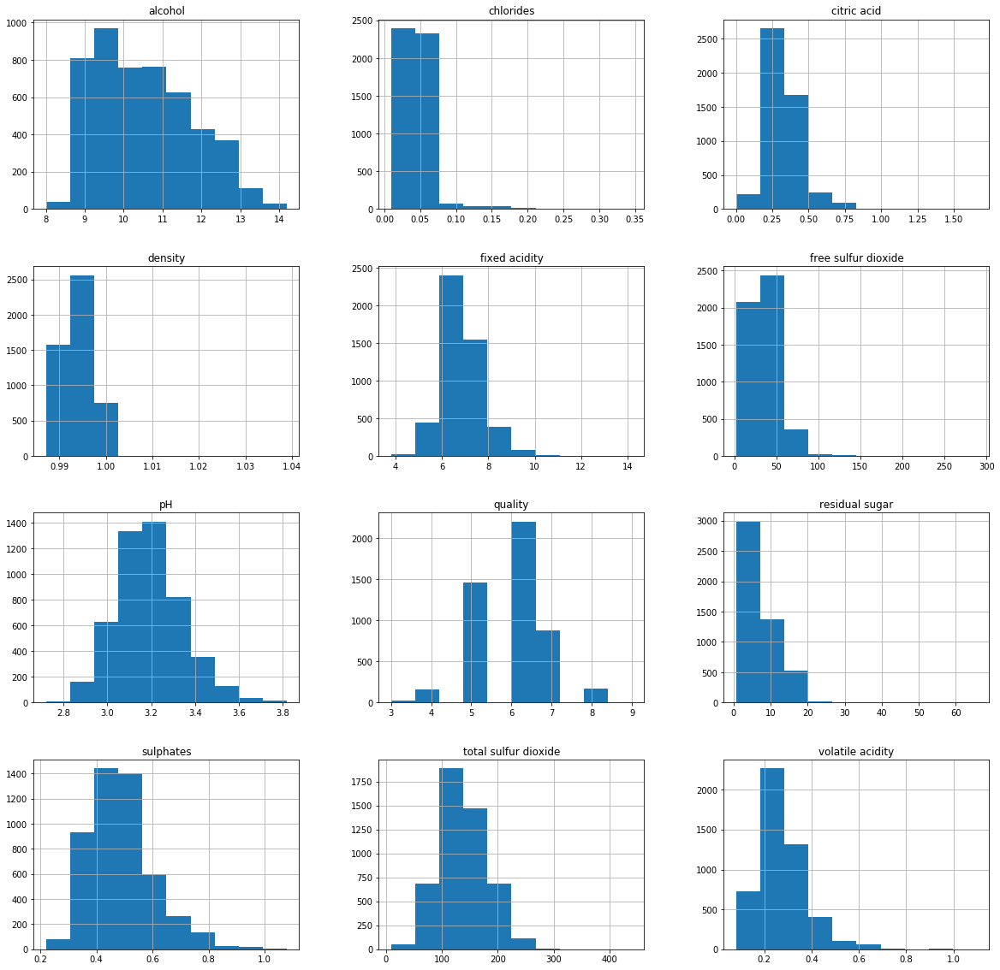

In [5]:
data.hist(figsize=(20, 20));

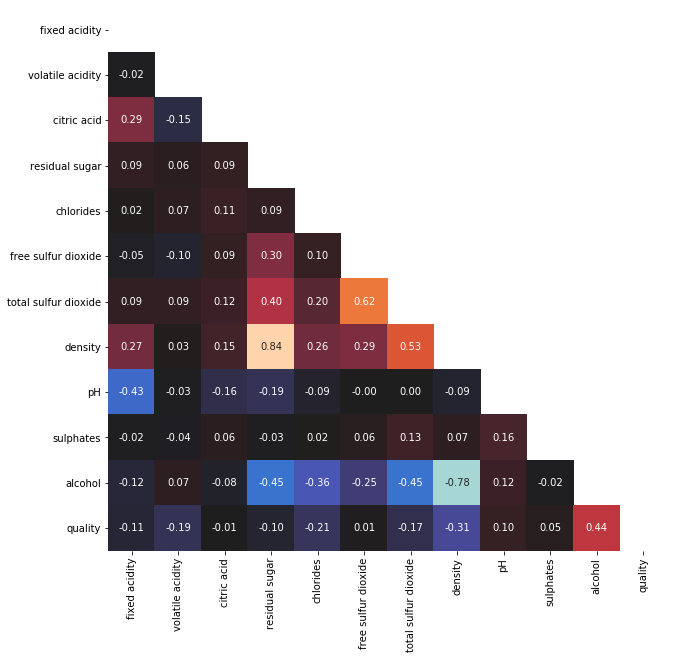

In [6]:
plt.figure(figsize=(10,10))

corr_matrix = data.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0);

In [7]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6)|(lower[column] < -0.6))
]
high_corr

['residual sugar', 'free sulfur dioxide', 'density']

In [8]:
other_features = [col for col in data.columns if col not in high_corr and col!='quality']

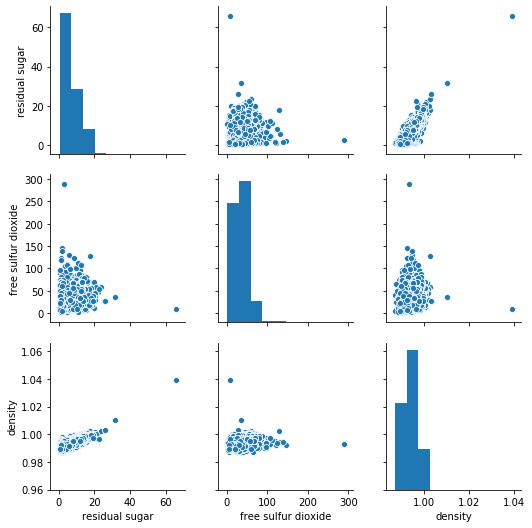

In [9]:
sns.pairplot(data[high_corr]);

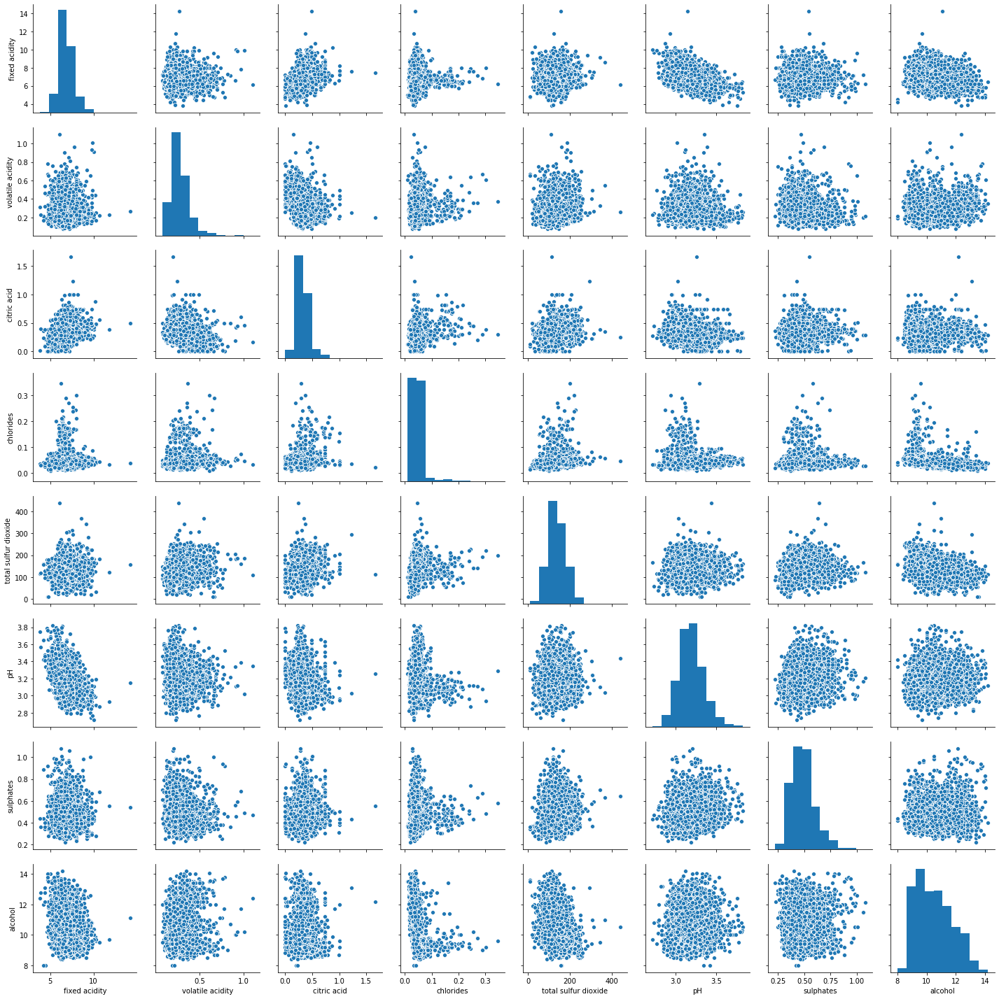

In [10]:
sns.pairplot(data[other_features]);

# 2. Простейшие методы

## <center> 3-сигмы</center> 

In [11]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [12]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
        
    outliers = pd.Series(data=[False]*len(data), index=data_features.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    
    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))    

In [13]:
data_features = data.iloc[:, :-1]

In [14]:
comparison_table, std_outliers = get_column_outliers(data_features)
anomalies_report(std_outliers)

Total number of outliers: 396
Percentage of outliers:   8.08%


In [15]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
fixed acidity,9.386392,4.323183,46.0,0.939159
volatile acidity,0.580625,-0.024143,81.0,1.653736
citric acid,0.697251,-0.028868,85.0,1.735402
residual sugar,21.607588,-8.824758,9.0,0.183748
chlorides,0.111316,-0.019772,102.0,2.082483
free sulfur dioxide,86.329497,-15.713327,32.0,0.653328
total sulfur dioxide,265.854851,10.866464,12.0,0.244998
density,1.003000,0.985055,3.0,0.061249
pH,3.641268,2.735265,32.0,0.653328
sulphates,0.832224,0.147469,48.0,0.979992


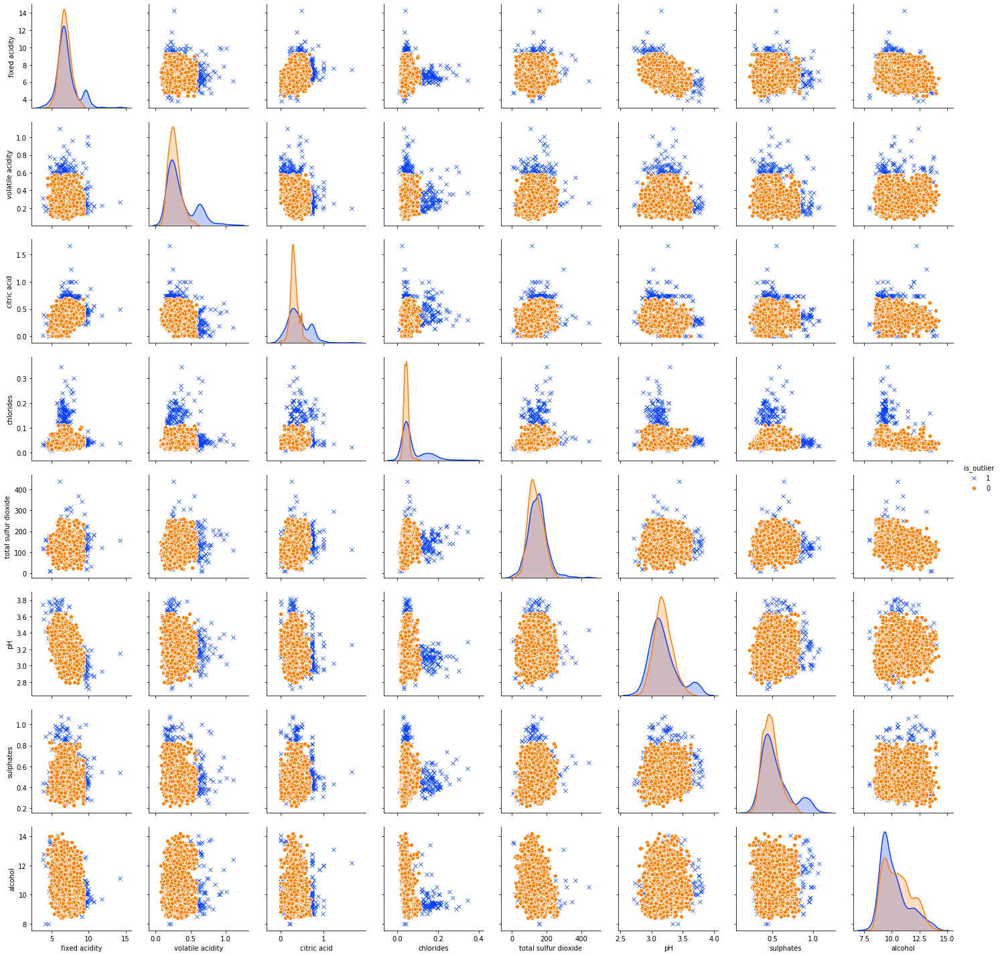

In [16]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

## <center> Межквартильное отклонение</center> 

In [17]:
def outlier_iqr(data, col, threshold=3):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [18]:
comparison_table, iqr_outliers = get_column_outliers(data_features, function=outlier_iqr)
anomalies_report(iqr_outliers)

Total number of outliers: 208
Percentage of outliers:   4.25%


In [19]:
comparison_table

,upper_bound,lower_bound,anomalies_count,anomalies_percentage
fixed acidity,10.300000,3.30000,4.0,0.081666
volatile acidity,0.650000,-0.12000,39.0,0.796243
citric acid,0.750000,-0.09000,22.0,0.449163
residual sugar,34.500000,-22.90000,1.0,0.020416
chlorides,0.092000,-0.00600,131.0,2.674561
free sulfur dioxide,115.000000,-46.00000,8.0,0.163332
total sulfur dioxide,344.000000,-69.00000,2.0,0.040833
density,1.009232,0.97859,3.0,0.061249
pH,3.850000,2.52000,0.0,0.000000
sulphates,0.970000,-0.01000,11.0,0.224581


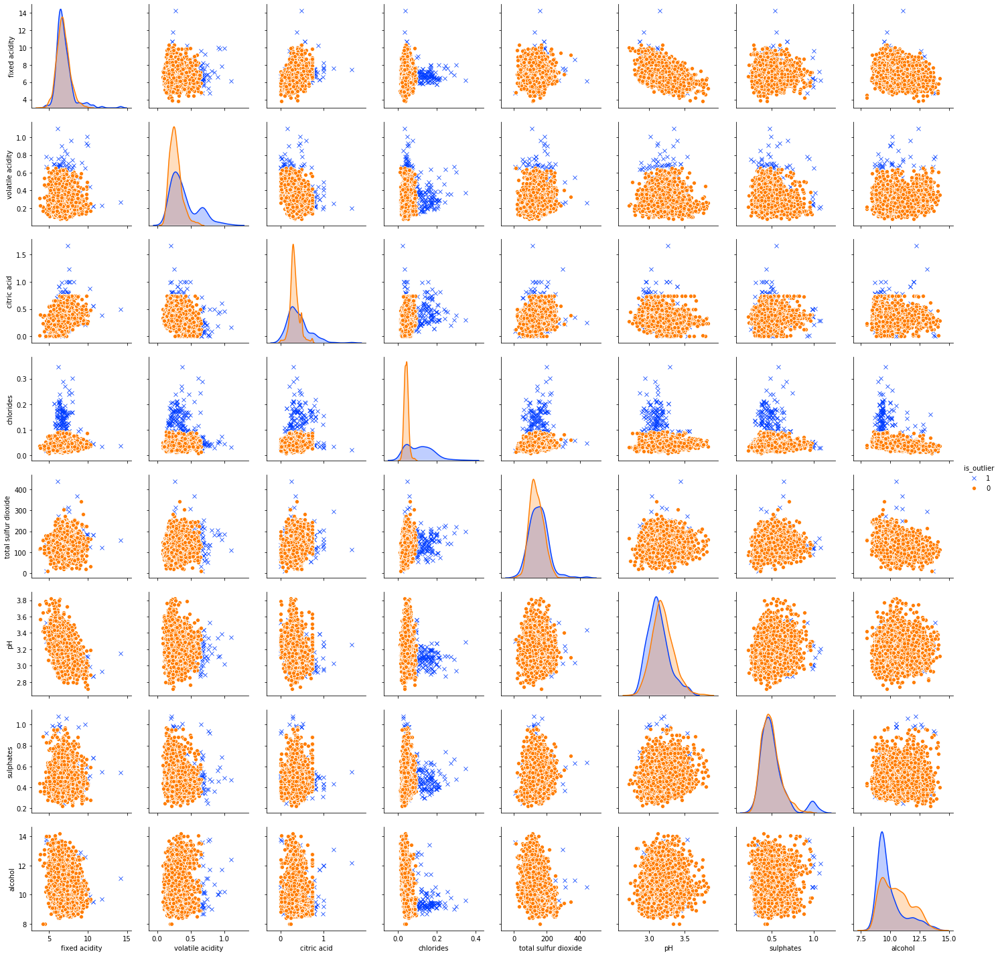

In [20]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = iqr_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

# 3. Кластеризация

## <center> Distance-based</center> 

In [21]:
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler

class DistanceOutliers(BaseEstimator):
    """
    Distance based outlier detector model
    
    Fit method calculates centroid of training samples and
    using `metric` get distances from centroid to train samples.
    Having distances - we calculate `threshold` based on `percentile`.
    
    Predict method uses `threshold` and `metric` to determine, whether
    distance to sample from centroid is too large -> outlier.
    
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

Так как мы имеем дело с расстояниями - нужно убедиться, что все данные в одном масштабе

In [22]:
scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
    columns=data_features.columns
)

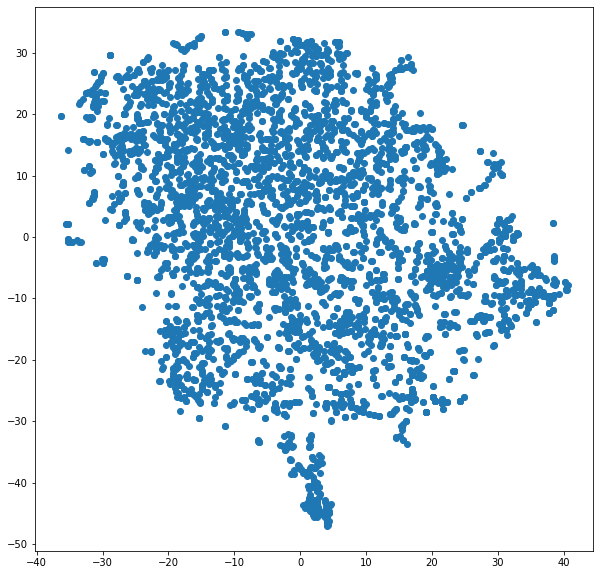

In [23]:
from MulticoreTSNE import MulticoreTSNE as TSNE
tsne = TSNE(perplexity=50, n_jobs=-1)
tsne_transformed = tsne.fit_transform(scaled_data)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1]);

In [24]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=90)
euclidian_model.fit(scaled_data)
euclidian_outliers = euclidian_model.predict(scaled_data)
anomalies_report(euclidian_outliers)

Total number of outliers: 490
Percentage of outliers:   10.00%


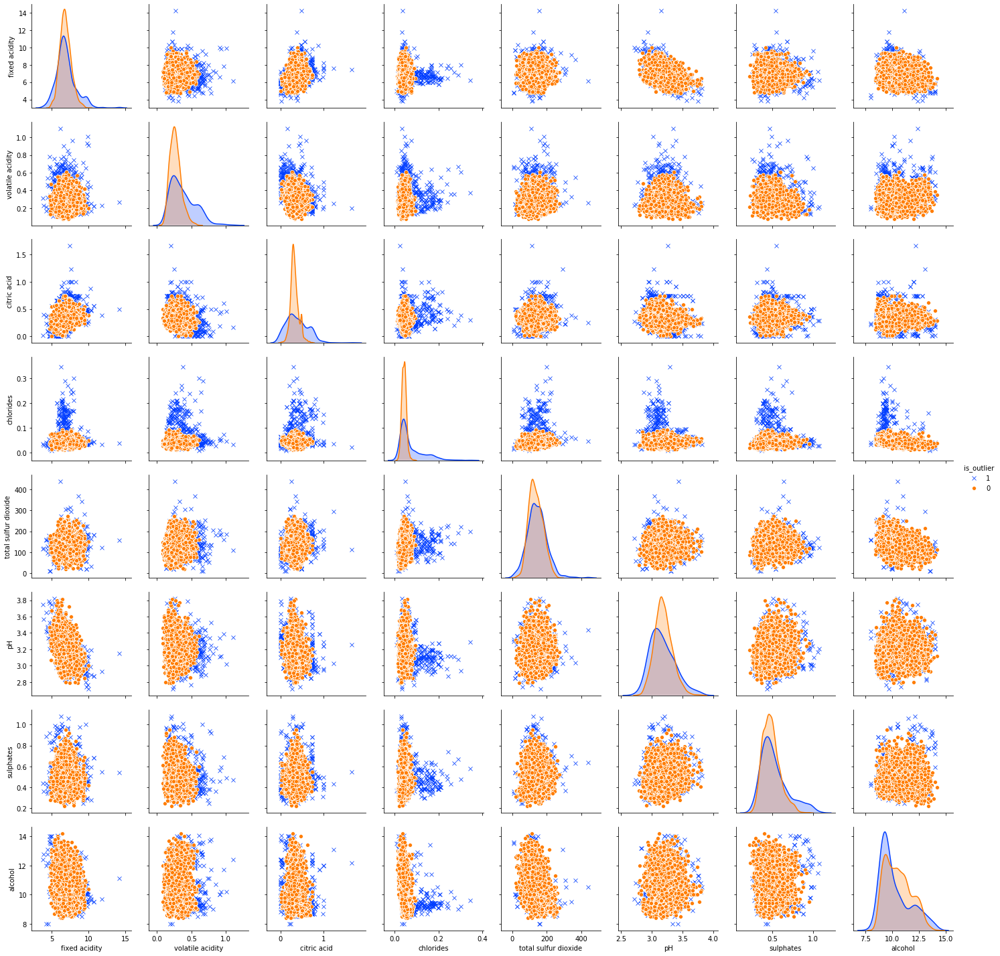

In [25]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = euclidian_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

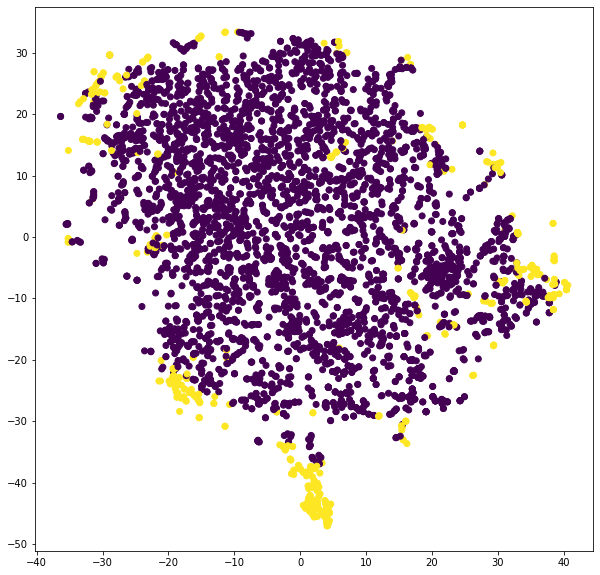

In [26]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

Total number of outliers: 490
Percentage of outliers:   10.00%


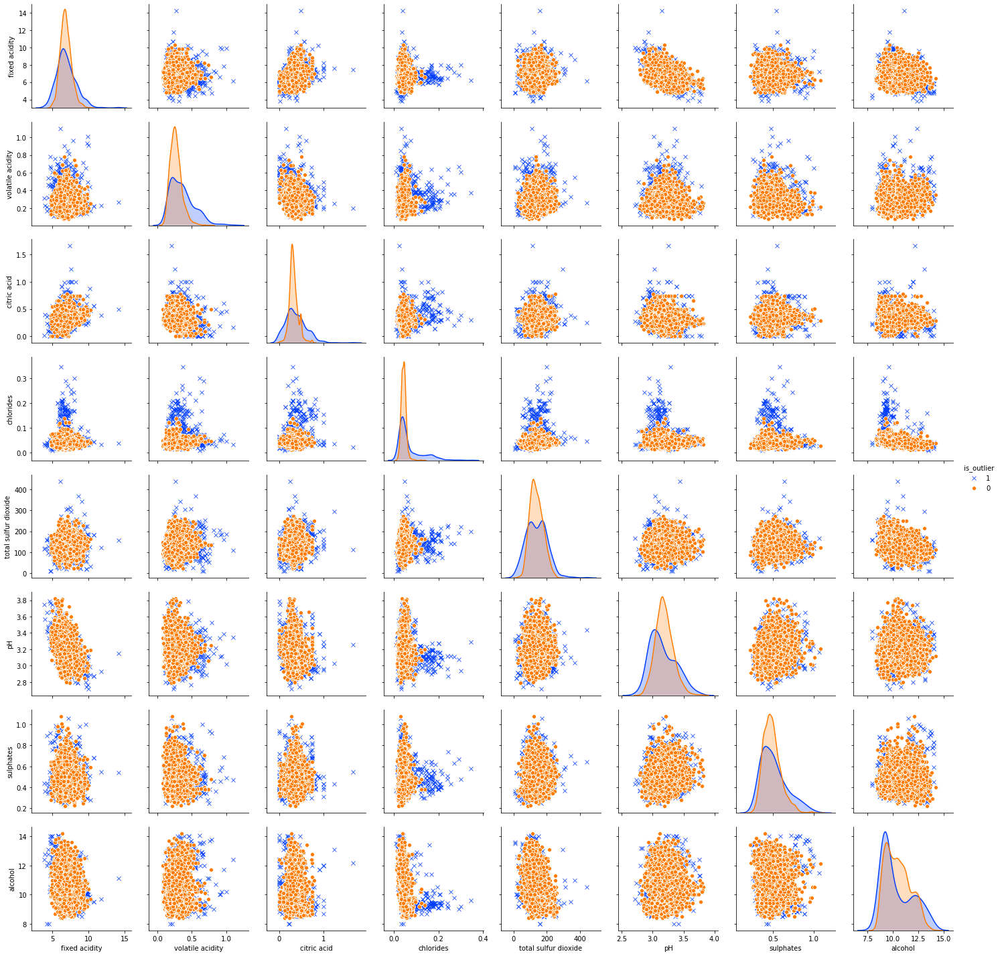

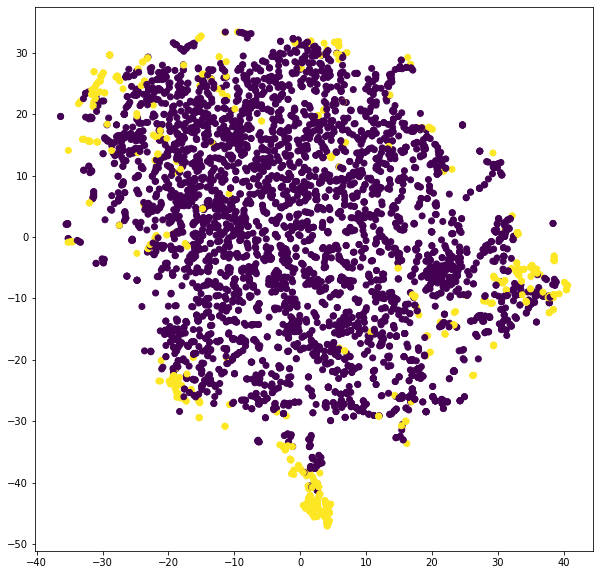

In [27]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=90)
citiblock_model.fit(scaled_data)
cityblock_outliers = citiblock_model.predict(scaled_data)
anomalies_report(cityblock_outliers)

labeled_data = data_features.copy()
labeled_data['is_outlier'] = cityblock_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=cityblock_outliers);

# <center> Density-based </center>

## <center>DBSCAN</center>

https://www.naftaliharris.com/blog/visualizing-dbscan-clustering/


<img src="https://upload.wikimedia.org/wikipedia/commons/a/af/DBSCAN-Illustration.svg" width=500>

**Алгоритм:**
- 1. Выбираем случайную точку и находим её соседей в заданной
окрестности
- 2. Если соседей меньше критического значения – называем выбросами
- 3. Если нет – объединяем в «плотный» кластер и повторяем поиск соседей
- 4. Если все плотные точки пройдены и помечены как посещенные – выбираем новую не посещенную точку и начинаем сначала

Повторяем, пока все точки не будут посещены


**Преимущества:**
- Density-based (плотностной/вероятностный) метод – умеет в сложные формы кластеров
- Поиск выбросов и аномалий в данных 

**Недостатки:**
- Довольно сложный в настройке – очень чувствителен к параметру ”плотности” epsilon

Идея - аномалии должны сильно отличаться от основных данных и скорее всего попадут в "шум". Почему бы не увеличивать epsilon до тех пор, пока все "плотные" данные не окажутся в нескольких немногочисленных кластерах, а шума будет столько, сколько мы подозреваем должно быть аномалий

In [28]:
from sklearn.cluster import DBSCAN

# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.05
eps_history = [eps]
while outlier_percentage>0.1:    
    model = DBSCAN(eps=eps).fit(scaled_data)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)    
    eps += 0.05
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)
    
model = DBSCAN(eps)
model.fit(scaled_data)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [29]:
anomalies_report(density_outlier)

Total number of outliers: 381
Percentage of outliers:   7.78%


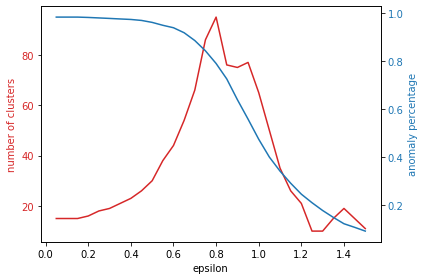

In [30]:
iterations = eps_history[:-1]

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('epsilon')
ax1.set_ylabel('number of clusters', color=color)
ax1.plot(iterations, num_clusters, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('anomaly percentage', color=color)  # we already handled the x-label with ax1
ax2.plot(iterations, anomaly_percentage, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

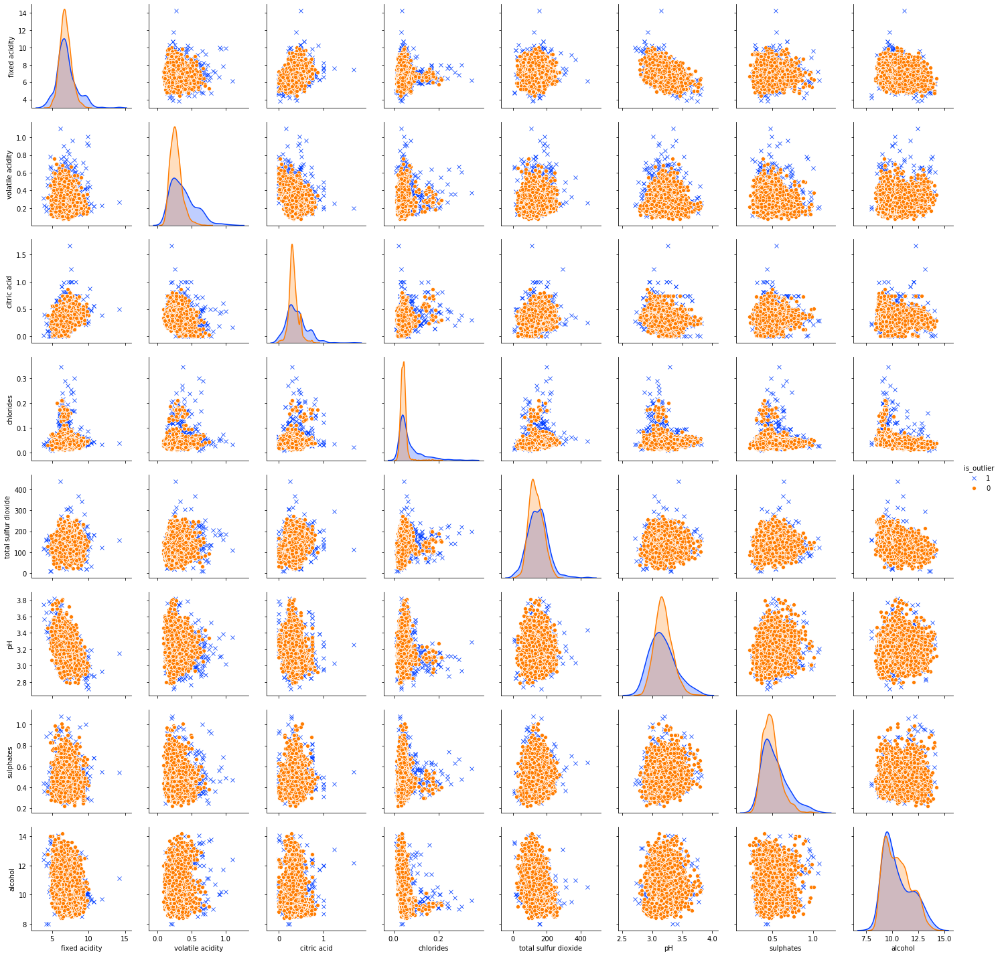

In [31]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = density_outlier

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

# <center>4. Unsupervised model-based</center>

## <center>One-Class SVM</center>

## Коротко о Support Vector Machine

Если совсем вкратце, SVM - базовая линейная модель. Основная идея алгоритма (в случае с классификацией) - разделить классы гиперплоскостью так, чтобы максимизировать расстояние (зазор) между ними. Изначально алгоритм был способен работать только с линейно разделимыми классами, однако в 90-е годы прошлого века метод стал особенно популярен из-за внедрения "Kernel Trick" (1992), позволившего эффективно работать с линейно неразделимыми данными. 

![](https://sandipanweb.files.wordpress.com/2018/04/svm_slack.png?w=676)

## Kernel Trick

Ядро (kernel) - это функция, которая способна преобразовать признаковое пространство (в том числе нелинейно), без непосредственного преобразования признаков. 

Крайне эффективна в плане вычисления и потенциально позволяет получать бесконечноразмерные признаковые пространства. 

Идея заключается в том, что классы, линейно неразделимые в текущем признаковом пространстве, могут стать разделимыми в пространствах более высокой размерности:

![](https://miro.medium.com/max/1838/1*eU9PzjVcLNbNEzBC2g_iWg.jpeg)

## One Class SVM
http://rvlasveld.github.io/blog/2013/07/12/introduction-to-one-class-support-vector-machines/

One Class SVM - это одна из форм классического алгоритма, однако, как следует из названия, для его обучения нам достаточно иметь всего один класс, пусть даже и немного "зашумленный", при этом мы хотим научиться для каждого нового наблюдения принимать решение, является ли оно аномальным или нет.

Общая идея: преобразовать признаковое пространство и провести разделяющую гиперплоскость так, чтобы наблюдения лежали как можно дальше от начала координат:

![](https://www.researchgate.net/profile/Hany_Alashwal/publication/242572058/figure/fig1/AS:393295319584771@1470780319210/Classification-in-one-class-SVM.png)

В результате мы получаем границу, по одну сторону которой лежат максимально "плотные" и похожие друг на друга наблюдения из нашей тренировочной выборки, а по другую будут находится аномальные значения, не похожие на все остальные. Процент таких аномальных наблюдений, которые модель будет пытаться отделить от основной части выборки, мы снова задаём в самом начале обучения при помощи параметра `nu`

In [32]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.1, gamma='auto')
one_class_svm.fit(scaled_data)
svm_outliers = one_class_svm.predict(scaled_data)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [33]:
anomalies_report(svm_outliers)

Total number of outliers: 499
Percentage of outliers:   10.19%


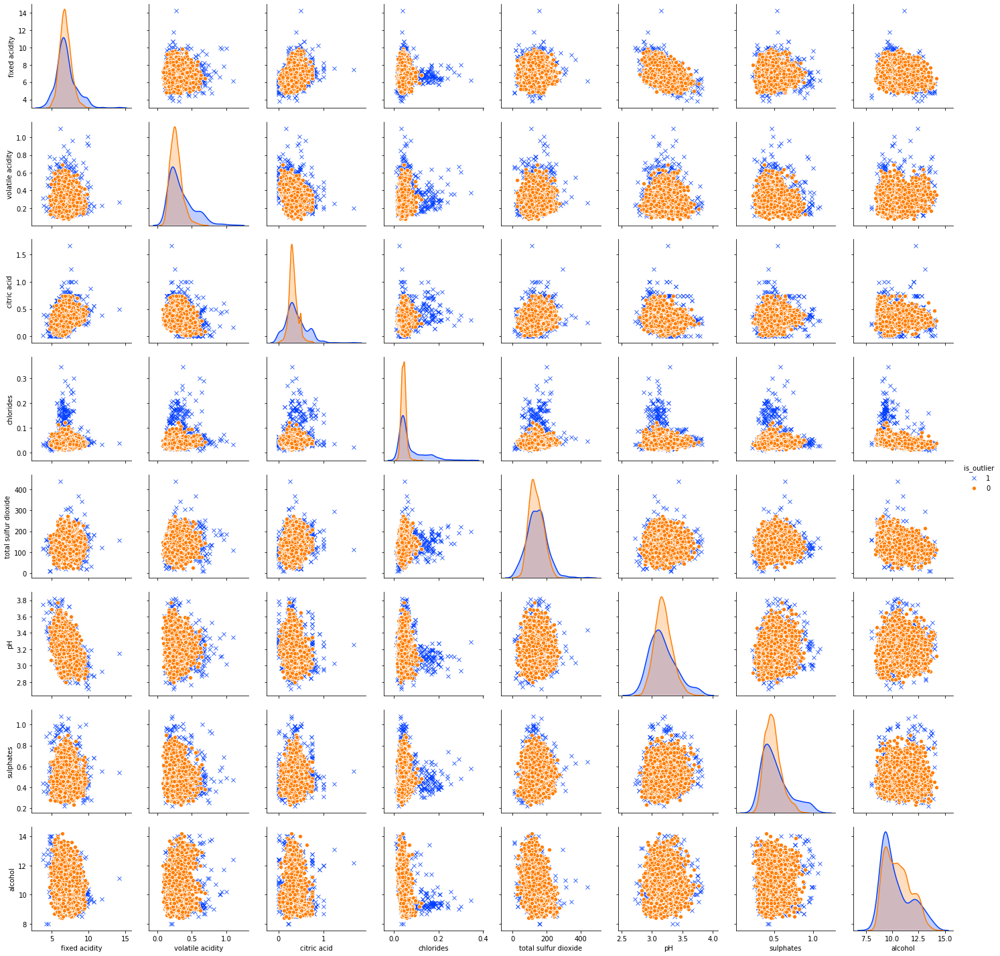

In [34]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = svm_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

## Плюсы и минусы

\+ Благодаря kernel trick, модель способна проводить **нелинейные разделяющие границы**

\+ Особенно удобно использовать, когда в данных недостаточно "плохих" наблюдений, чтобы использовать стандартный подход обучения с учителем - бинарную классификацию

\- Может очень сильно **переобучиться** и выдавать большое количество ложно отрицательных результатов, если разделяющий зазор слишком мал

## <center> Isolation Forest </center>

Идея - давайте посмотрим, насколько легко можно "изолировать" наблюдение от всех остальных. Если слишком легко, наверное она лежит далеко и является выбросом. Если очень тяжело - скорее всего она похожа на кучу других точек и выбросом не является. 

<img src="pictures/isolation.png" width=400>

<img src="pictures/isolation2.png" width=400>

Алгоритм:
1. Select the point to isolate.
2. For each feature, set the range to isolate between the minimum and the maximum.
3. Choose a feature randomly.
4. Pick a value that’s in the range, again randomly:
    - If the chosen value keeps the point above, switch the minimum of the range of the feature to the value.
    - If the chosen value keeps the point below, switch the maximum of the range of the feature to the value.
5. Repeat steps 3 & 4 until the point is isolated. That is, until the point is the only one which is inside the range for all features.
6. Count how many times you’ve had to repeat steps 3 & 4. We call this quantity the isolation number.

https://quantdare.com/isolation-forest-algorithm/

In [42]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=0.1, 
                                   max_features=1.0, bootstrap=True, behaviour="new")
isolation_forest.fit(scaled_data)

isolation_outliers = isolation_forest.predict(scaled_data)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [43]:
anomalies_report(isolation_outliers)

Total number of outliers: 490
Percentage of outliers:   10.00%


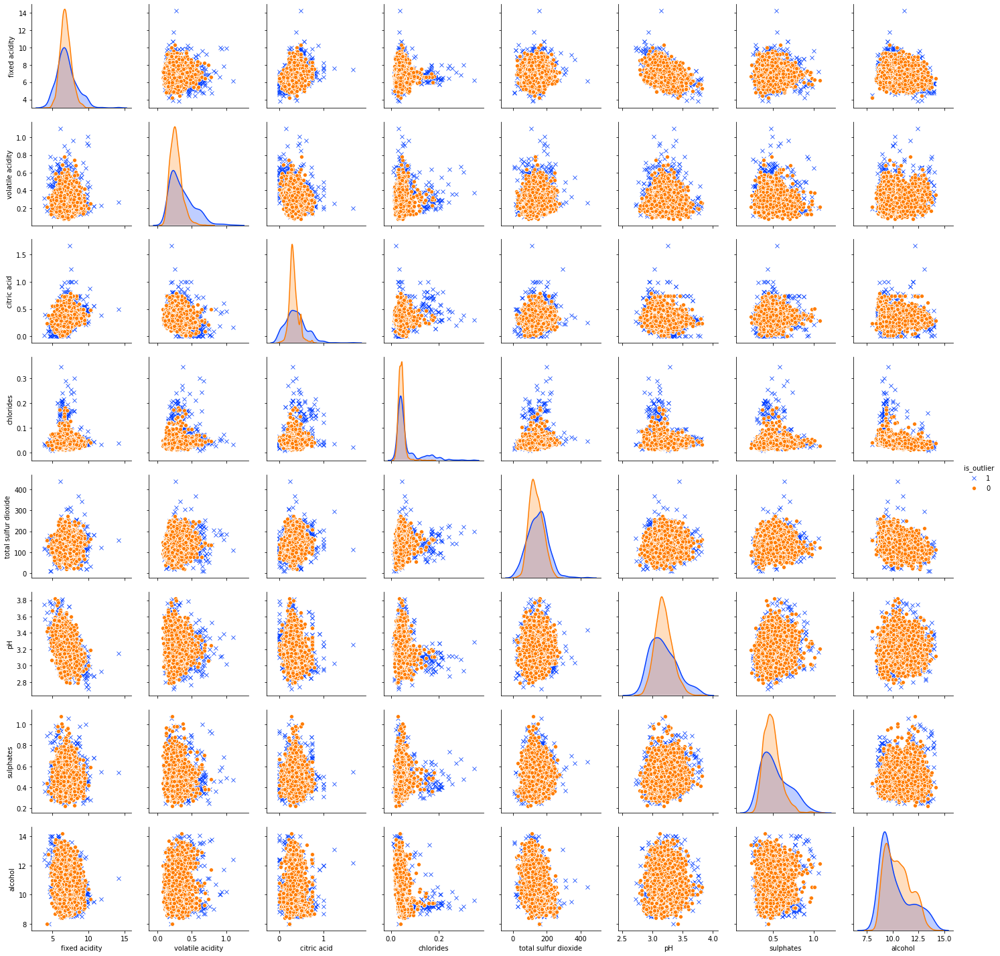

In [44]:
labeled_data = data_features.copy()
labeled_data['is_outlier'] = isolation_outliers

sns.pairplot(data=labeled_data, vars = other_features,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

## Плюсы и минусы

\+ Снова **нелинейные разделяющие границы**, интуитивно понятные принципы работы

\+ Снова удобно использовать, когда не можем в бинарную классификацию

\- Довольно сложная настройка параметров, которую тяжело проводить, не имея хотя бы минимальной разметки или предположения о количестве "грязных" наблюдений - параметр `contamination`

# Финальное сравнение

In [45]:
summary = np.concatenate((
    [std_outliers], 
    [iqr_outliers], 
    [euclidian_outliers], 
    [cityblock_outliers],
    [density_outlier],
    [svm_outliers],
    [isolation_outliers]
))

In [46]:
summary = pd.DataFrame(
    summary.T, 
    columns=['std', 'iqr', 'euclid', 'cityblock', 'dbscan', 'svm', 'isolation']
)
summary.head()

,std,iqr,euclid,cityblock,dbscan,svm,isolation
0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0


In [47]:
summary.sum(axis=1).value_counts()

0    4094
1     193
6     122
2     105
4     105
7      97
3      95
5      87
dtype: int64

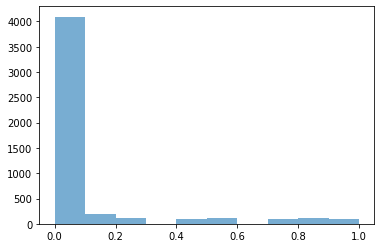

In [48]:
outlier_score = summary.mean(axis=1)
plt.hist(outlier_score, alpha=0.6);

## All combined

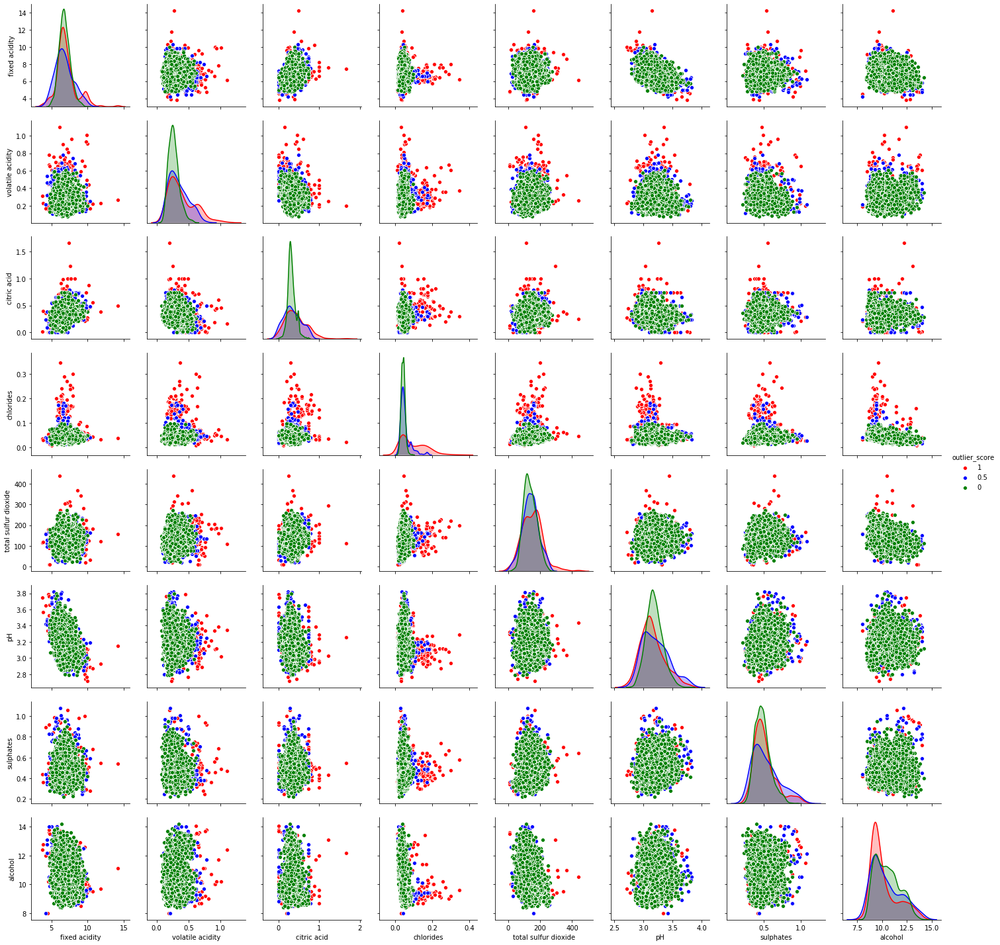

In [49]:
simple_score = outlier_score.apply(lambda x: 0 if x < 0.4 else 0.5 if x < 0.8 else 1)

labeled_data = data_features.copy()
labeled_data['outlier_score'] = simple_score

custom_palette = {0:'g', 0.5:'b', 1.0:'r'}

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
             hue_order=[1, 0.5, 0],
             palette=custom_palette
)

## Just model based

0    4180
1     282
2     220
3     216
dtype: int64

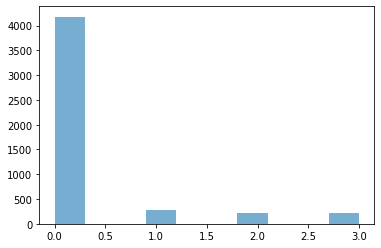

In [50]:
outliers_score_model_based = summary[['dbscan', 'svm', 'isolation']].sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6);
outliers_score_model_based.value_counts()

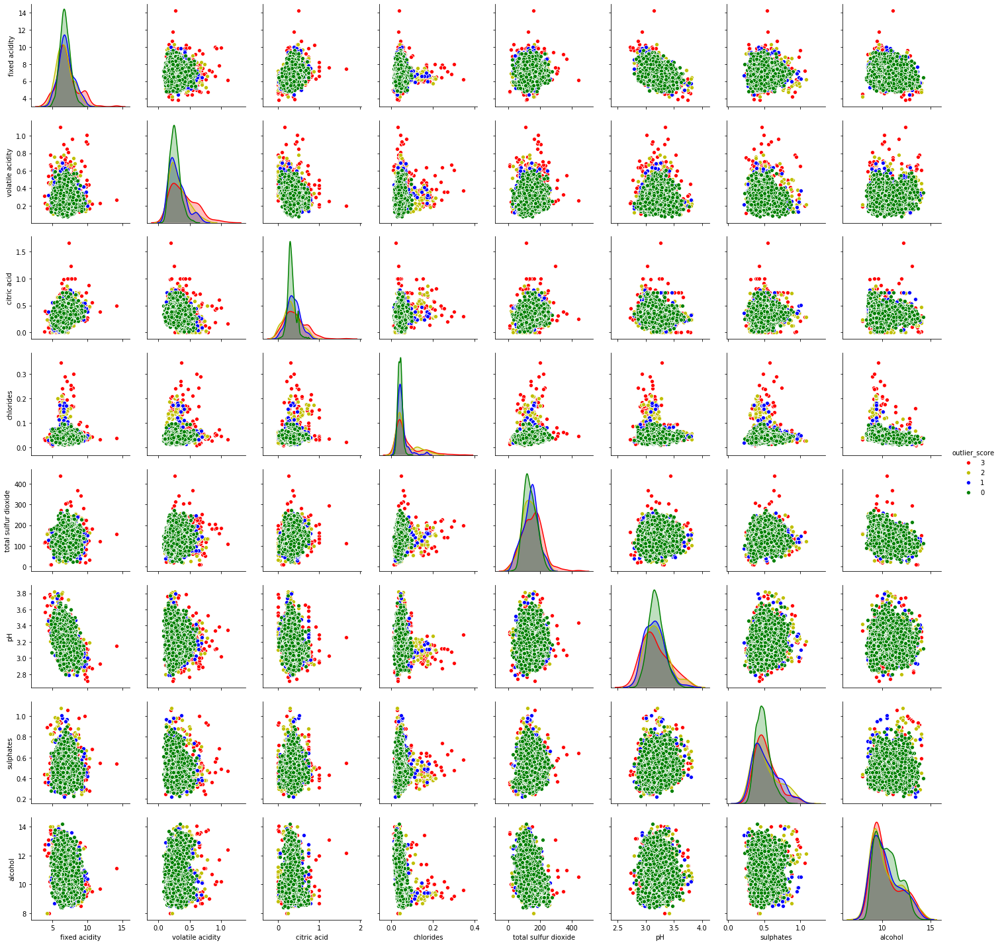

In [51]:
labeled_data = data_features.copy()
labeled_data['outlier_score'] = outliers_score_model_based

custom_palette = {0:'g', 1:'b', 2:'y', 3:'r'}

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

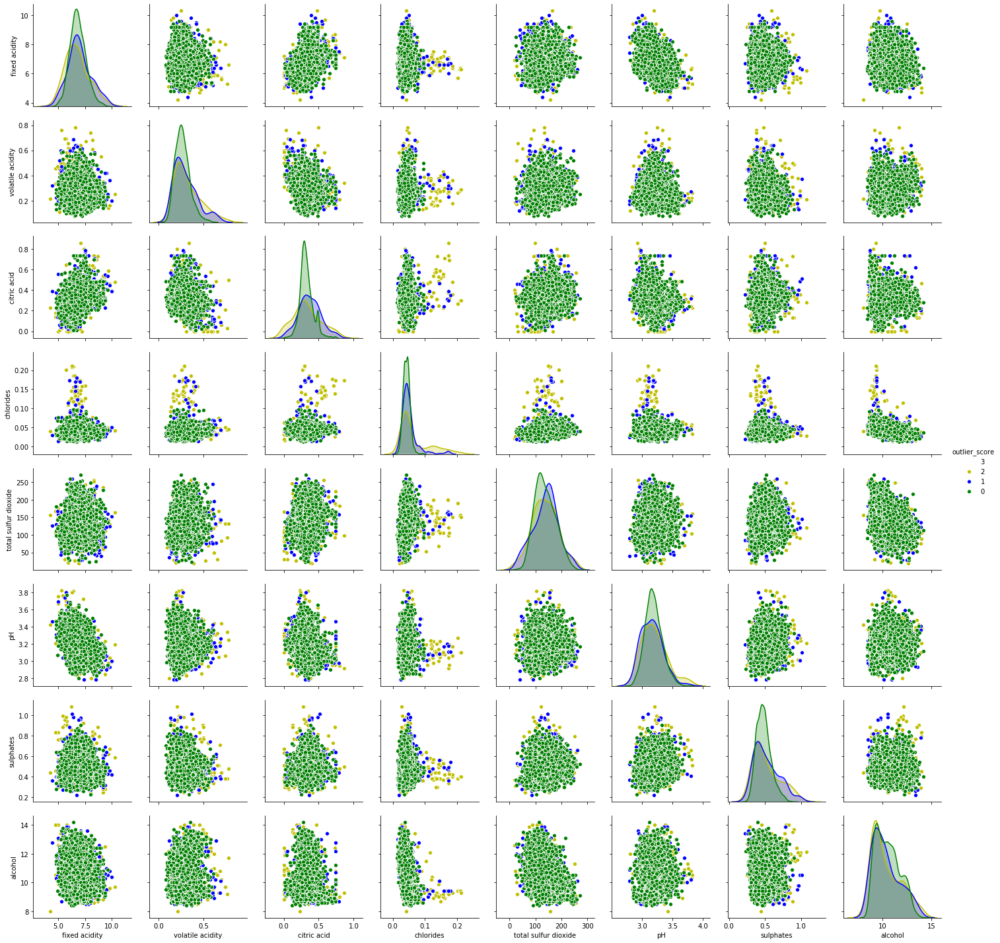

In [52]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score!=3],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

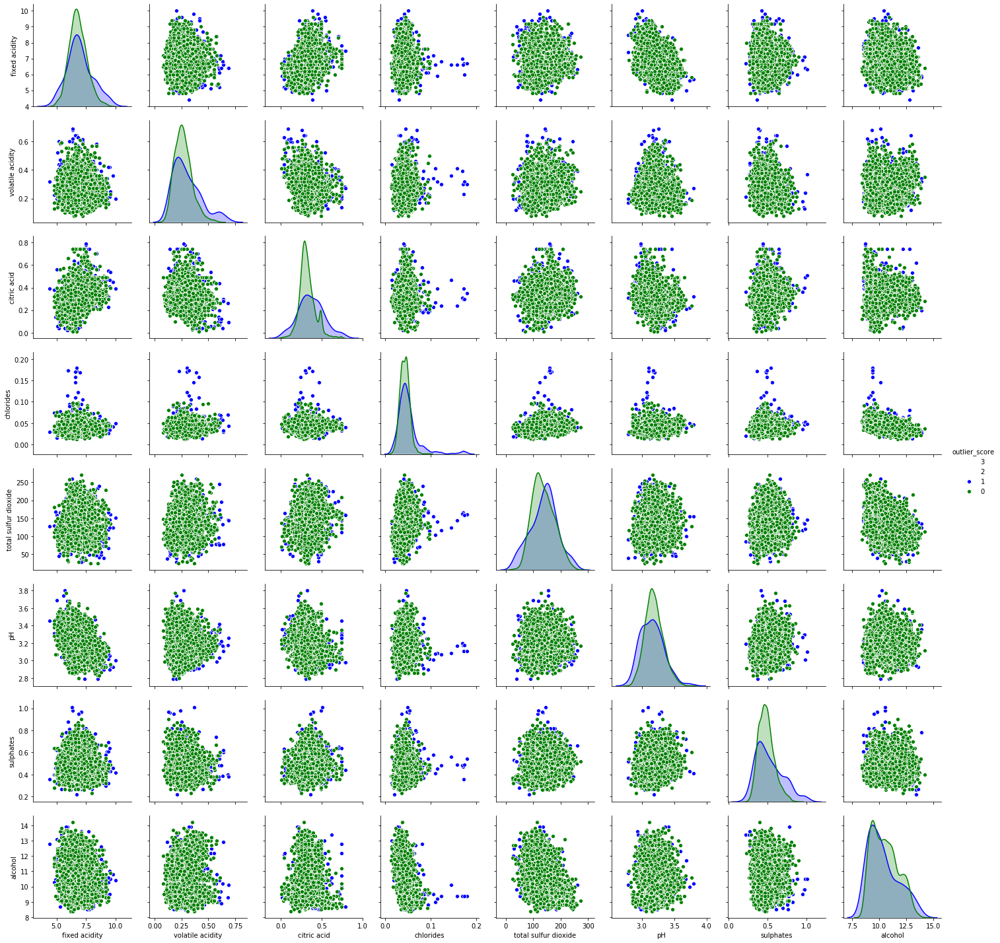

In [53]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score.isin([0, 1])],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

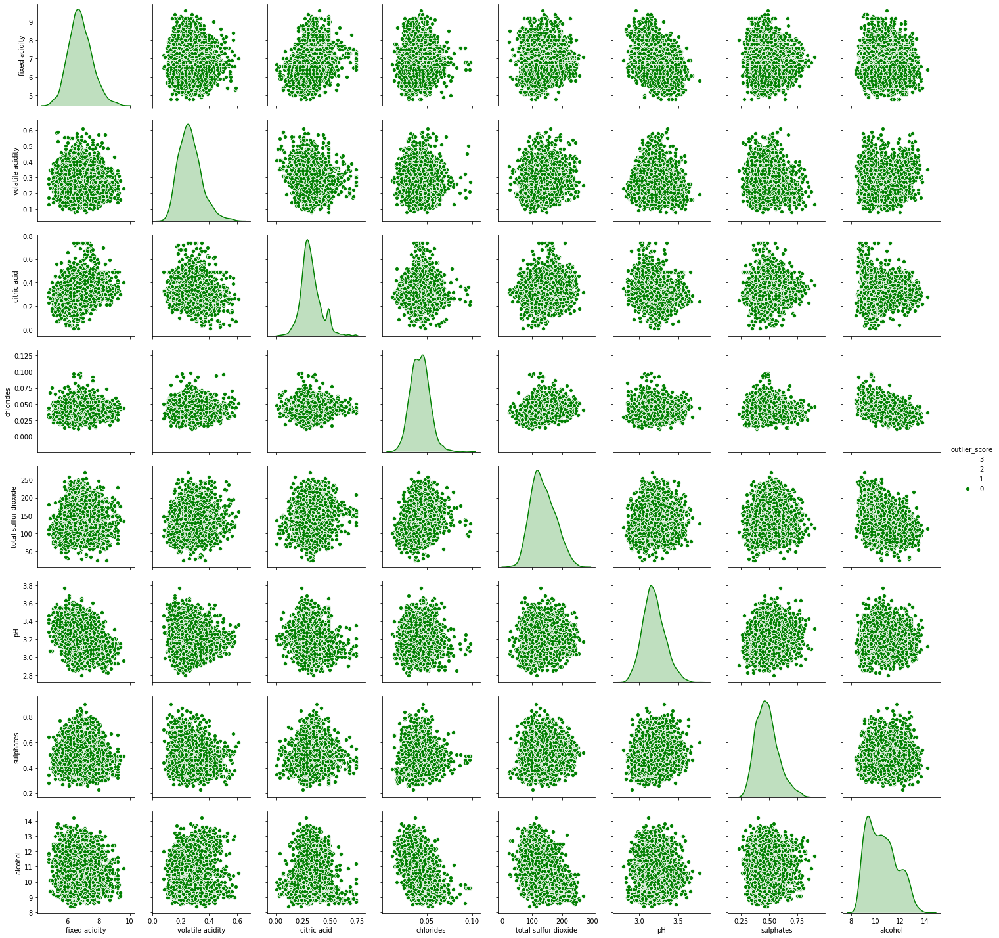

In [54]:
sns.pairplot(data=labeled_data[labeled_data.outlier_score.isin([0])],
             vars=other_features, 
             hue='outlier_score',
             hue_order=[3, 2, 1, 0],
             palette=custom_palette
)

Дополнительные материалы
- Поиск аномалий во временных рядах https://medium.com/open-machine-learning-course/open-machine-learning-course-topic-9-time-series-analysis-in-python-a270cb05e0b3
- Плотностные методы для поиска аномалий https://towardsdatascience.com/density-based-algorithm-for-outlier-detection-8f278d2f7983
- Верхнеуровневая библиотека с кучей методов https://www.analyticsvidhya.com/blog/2019/02/outlier-detection-python-pyod/
- Еще раз про классику https://blog.floydhub.com/introduction-to-anomaly-detection-in-python/

# <center>Опрос</center>

<center>https://otus.pw/n1NN/</center>